# 3강. 잘 만든 Augmentation, 이미지 100장 안 부럽다.
## 3-5. 텐서플로우를 사용한 Image Augmentation (1) Flip
### 데이터 준비하기
- 매개변수에 전달하는 값을 바꿔보고 데이터에 랜덤하게 적용해보기  
- 이미지를 PIL로 로드한 후 이를 텐서로 바꾼 뒤, 기법을 하나씩 적용해보고 다시 이미지로 화면에 표시하기

In [1]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = os.getenv('HOME')+'/aiffel/data_augmentation/images/mycat.jpg'
sample_img_path

'/aiffel/aiffel/data_augmentation/images/mycat.jpg'

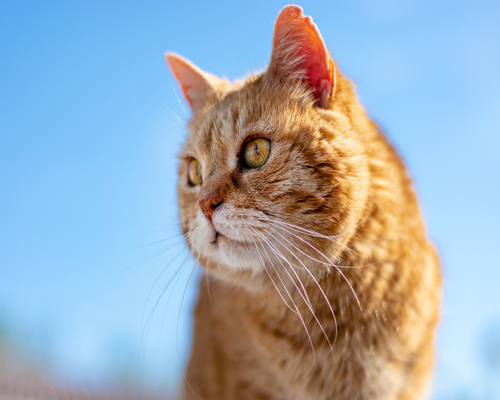

In [2]:
image = Image.open(sample_img_path).resize((500, 400)) # 500x400으로 크기 조절(이미지에 따라 숫자 바꾸기)
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

image

### Flip 해보기

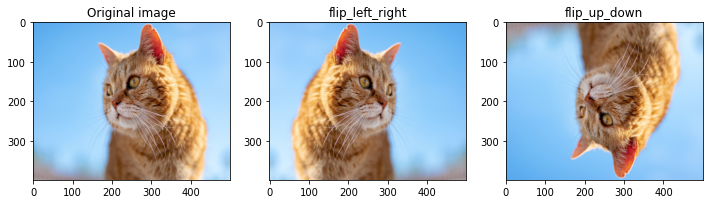

In [3]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right') # 좌우반전
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down') # 상하반전
plt.imshow(flip_ud_image)

plt.show()

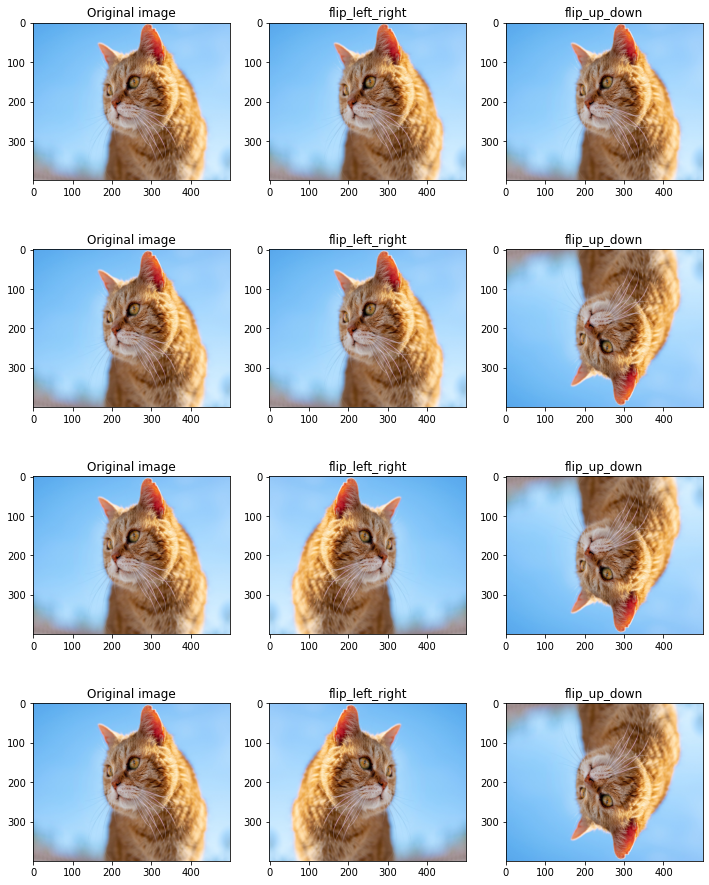

In [4]:
# random augmentation
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

- 반전이 되지 않은 원본 데이터도 활용하기 위해서 상하 또는 좌우 반전을 확률에 따라서 적용되도록 한다.  
- random_flip으로 상하좌우 반전을 적용하는 함수를 만드는 것도 가능하다.

## 3-6. 텐서플로우를 사용한 Image Augmentation (2) Center Crop


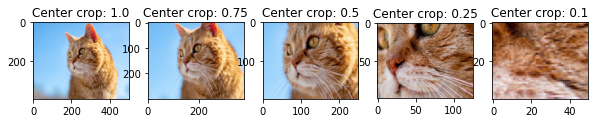

In [5]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

- central_fraction : 얼마나 확대할지를 조절하는 매개변수

In [6]:
def random_central_crop(image_tensor, range=(0, 1)):
    # range 범위에서 무작위로 잘라낼 비율을 선택
    central_fraction = tf.random.uniform([1], minval=range[0], maxval=range[1], dtype=tf.float32)
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor

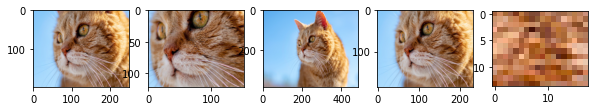

In [8]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

## 3-7. 텐서플로우를 사용한 Image Augmentation (3) 직접 해보기
### tf.image.random_crop()
- [tf.image.random_crop](https://www.tensorflow.org/api_docs/python/tf/image/random_crop)

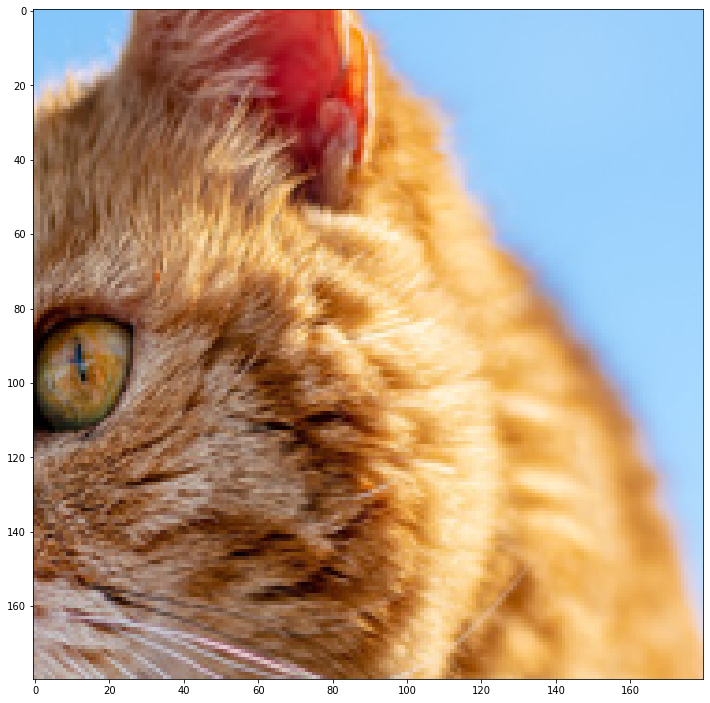

In [9]:
# random_crop
plt.figure(figsize=(12, 15))

random_crop_tensor = tf.image.random_crop(image_tensor,[180,180,3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

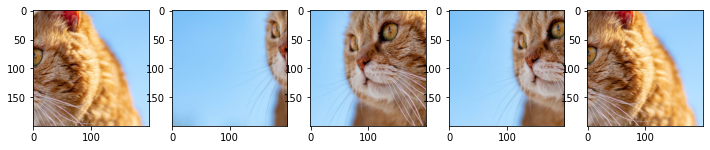

In [10]:
# 5개의 random cropped images
plt.figure(figsize=(12, 15))

for i in range(5):
  random_crop_tensor = tf.image.random_crop(image_tensor,[200,200,3])
  random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)
  plt.subplot(1,5,i+1)
  plt.imshow(random_crop_image)

### tf.image.random_brightness()
- [tf.image.random_brightness()](https://www.tensorflow.org/api_docs/python/tf/image/random_brightness)

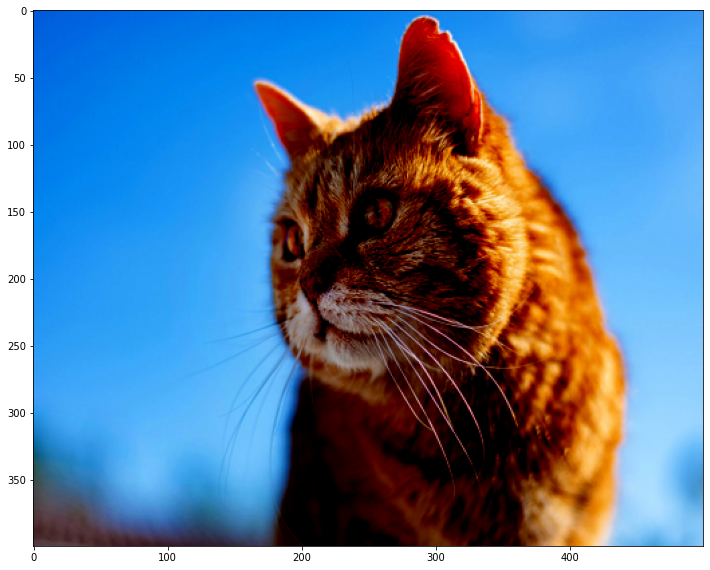

In [11]:
# random_brightness
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

- tf.image.random_brightness()만 적용할 경우 이미지 텐서 값의 범위가 0~255를 초과하게 될 수도 있으므로 tf.clip_by_value()를 적용하여 plt.imshow()에서 rescale되어 밝기 변경 효과가 상쇄되어 보일 수 있는 것을 방지해야한다.

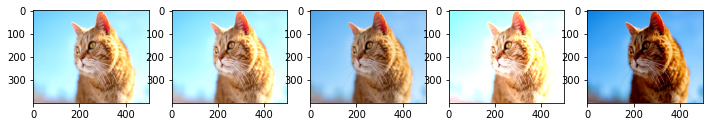

In [12]:
# 5개의 random brightness images
plt.figure(figsize=(12, 15))

for i in range(5):
  random_bright_tensor = tf.image.random_brightness(image_tensor,max_delta=128)
  random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
  random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

  plt.subplot(1,5,i+1)
  plt.imshow(random_bright_image)

## 3-8. albumentations 라이브러리
### albumentations 라이브러리 사용하기
- [albumentations library](https://github.com/albumentations-team/albumentations)

In [13]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자 바꾸기
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

- augmentation에서는 배열을 이미지의 기본 형태로 사용 -> PIL Image 데이터형을 넘파이(numpy) 배열로 변환하여 사용한다.

In [14]:
# 이미지를 볼 수 있는 함수
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

### augmentation 기법 사용해보기

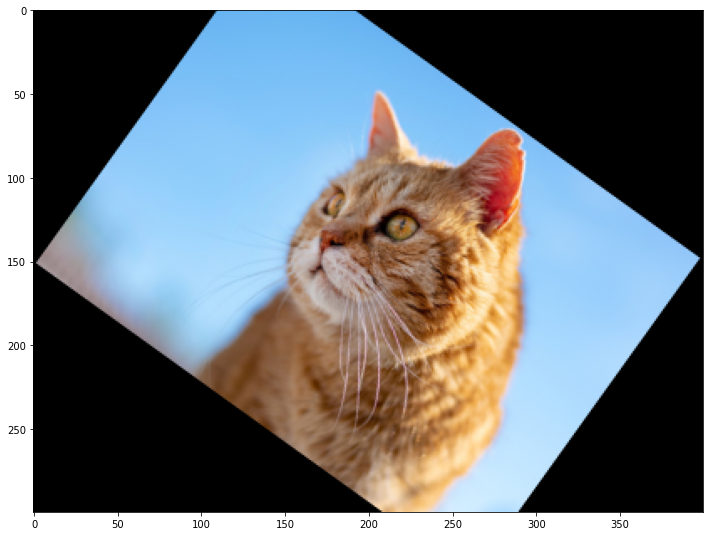

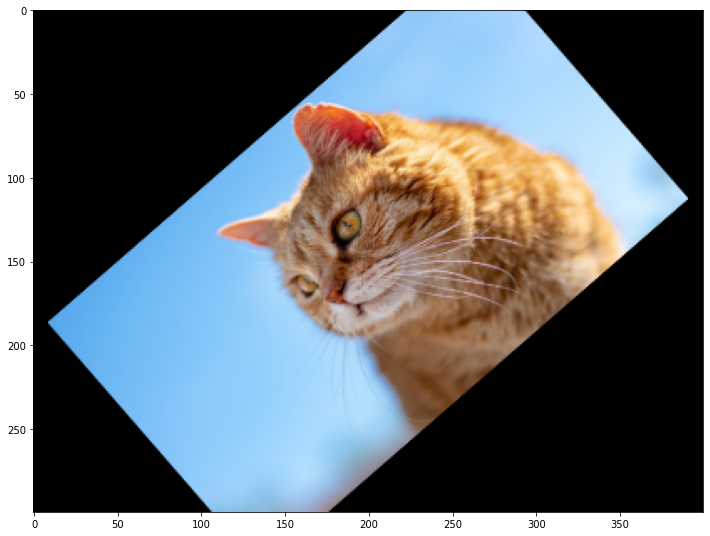

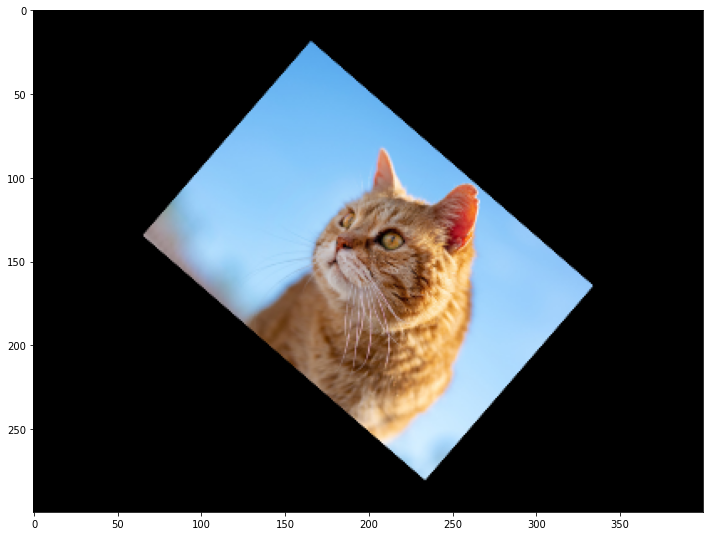

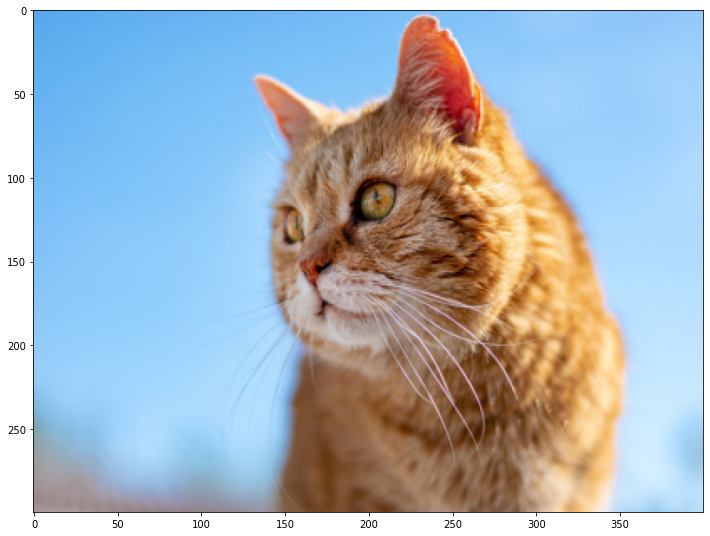

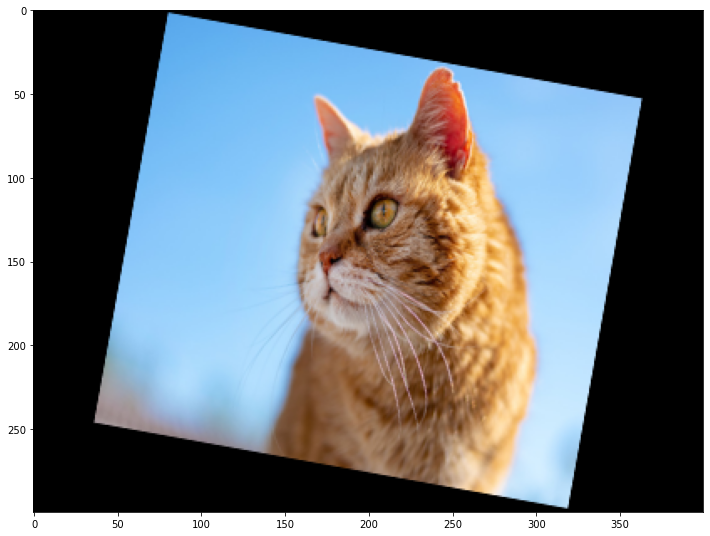

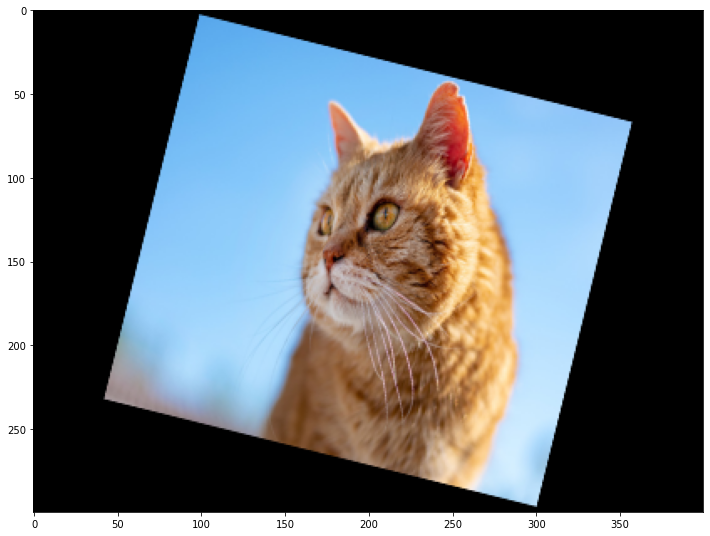

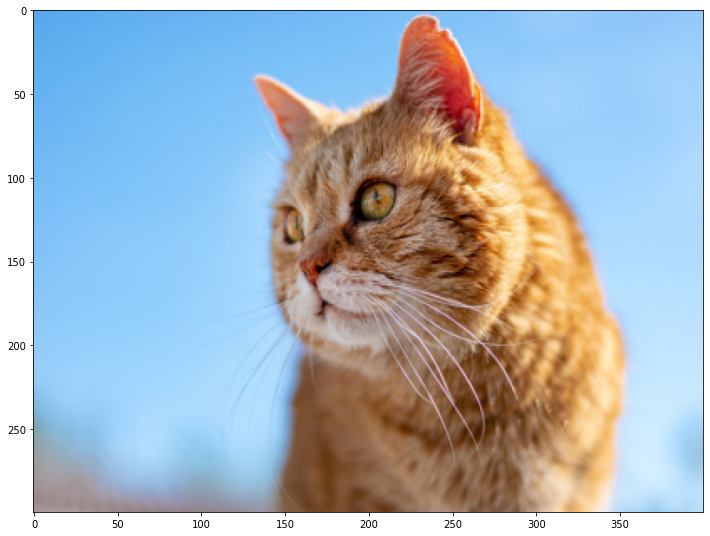

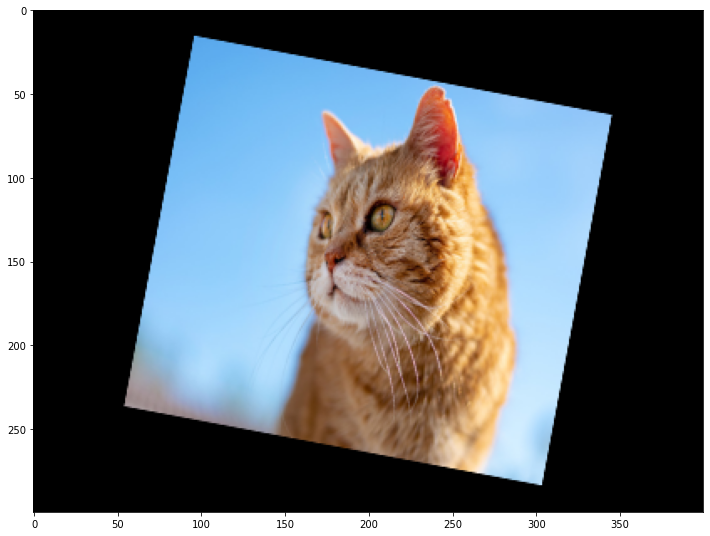

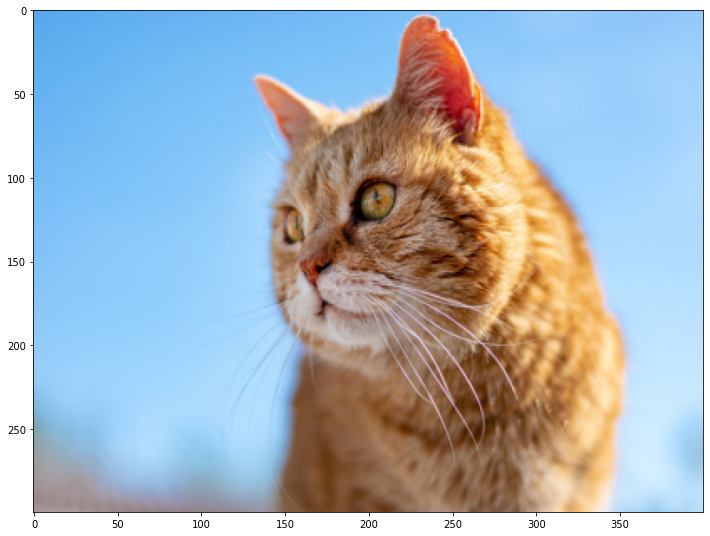

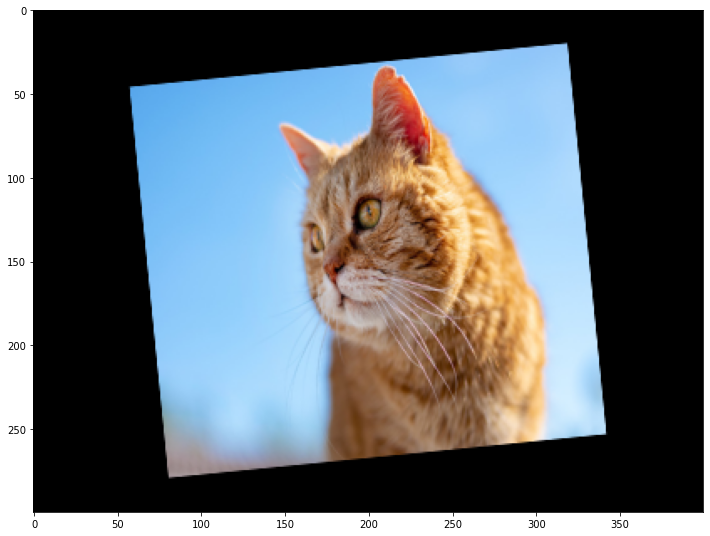

In [15]:
# transforms.Affine()
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) # -45도와 45도 사이에 랜덤하게 각도를 변환(10장)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

- [transforms.Affine()](https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#albumentations.augmentations.geometric.transforms.Affine) : 2D 변환의 일종. 이미지의 스케일(scale)을 조절하거나 평행이동, 또는 회전 등의 변환을 줄 수 있다.

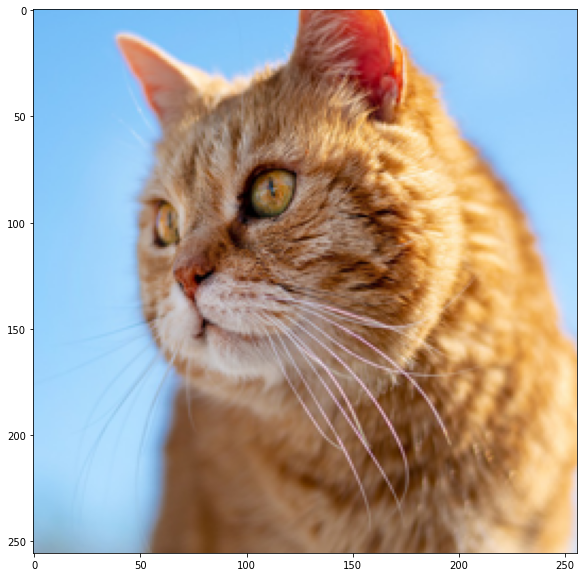

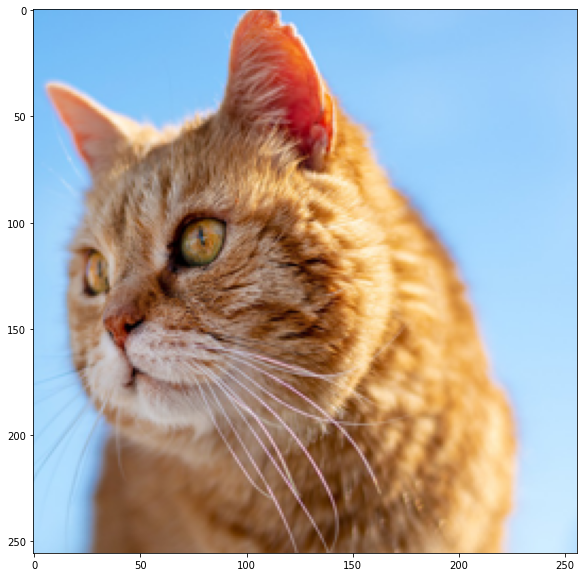

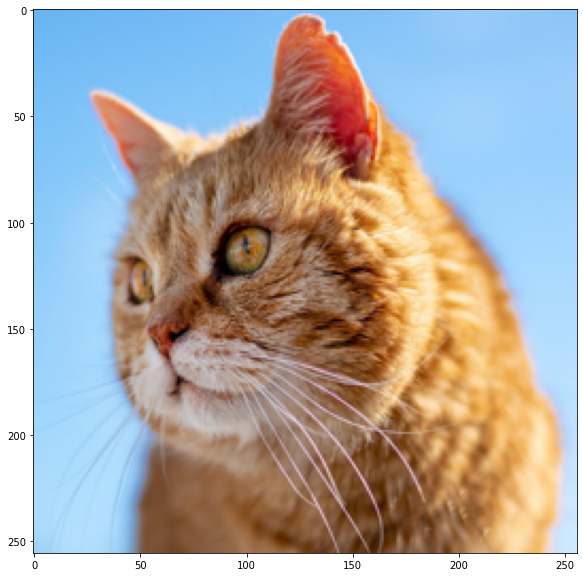

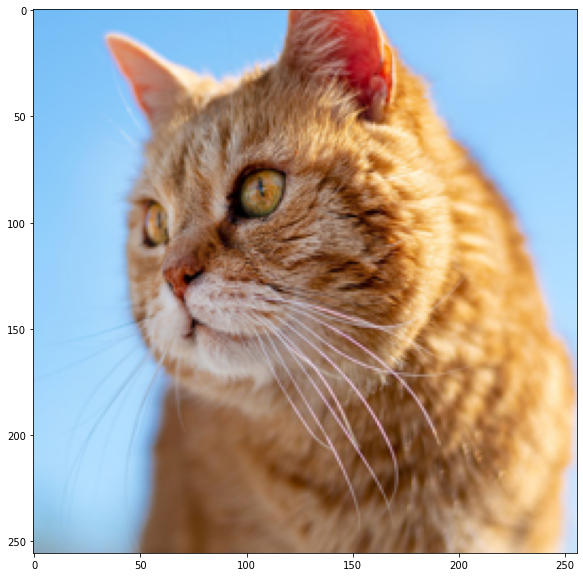

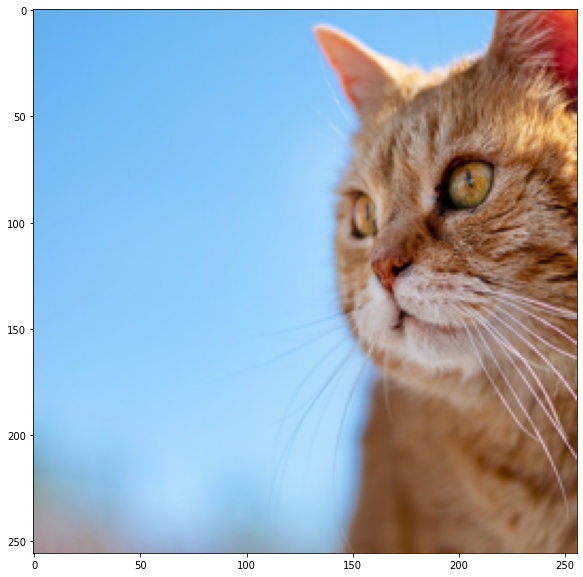

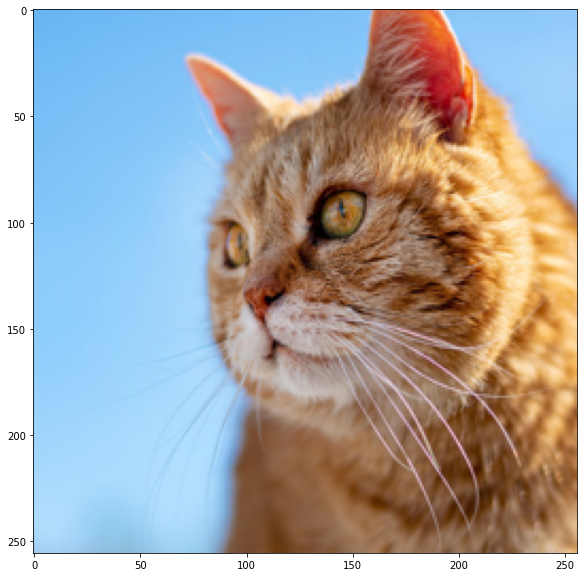

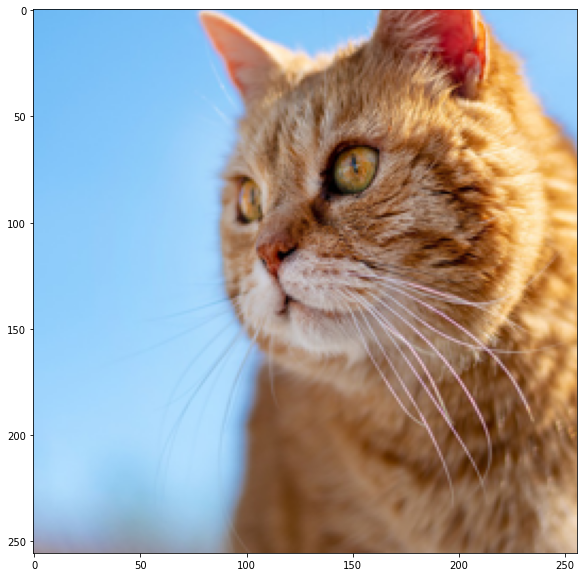

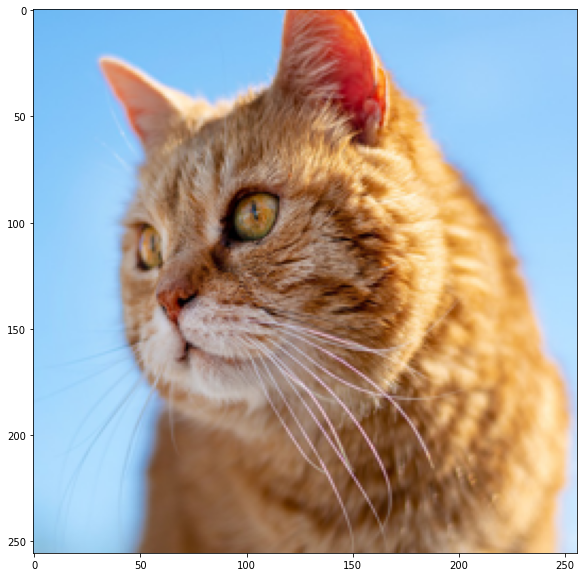

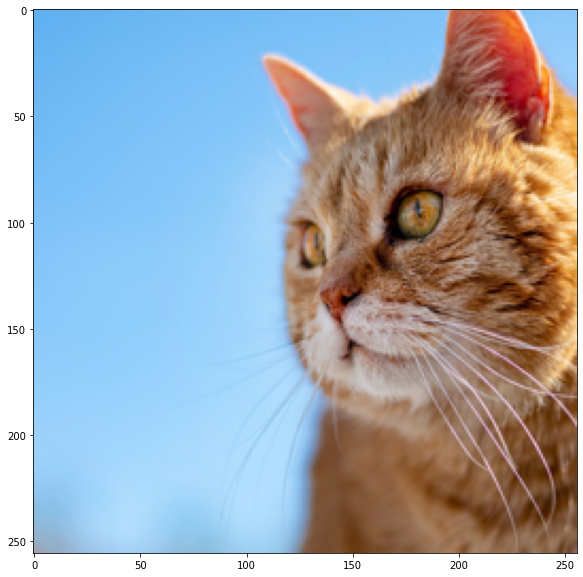

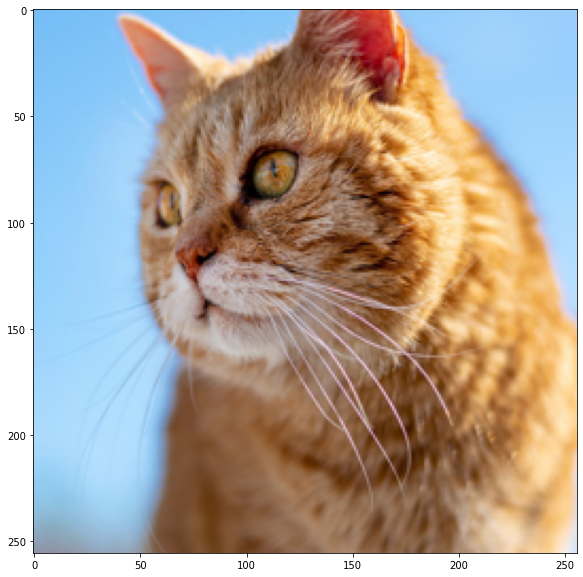

In [16]:
# transforms.RandomCrop()
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)] # 256x256 정도의 부분을 랜덤하게 crop(10장)
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

- [transforms.RandomCrop()](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#albumentations.augmentations.crops.transforms.RandomCrop)

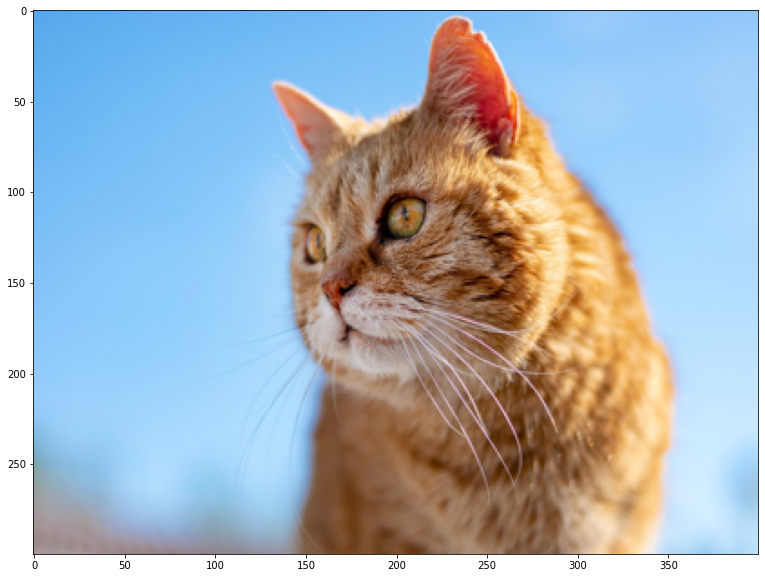

In [17]:
# MedianBlur()
transform = A.Compose(
    [A.MedianBlur(blur_limit=7, always_apply=False, p=0.5)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

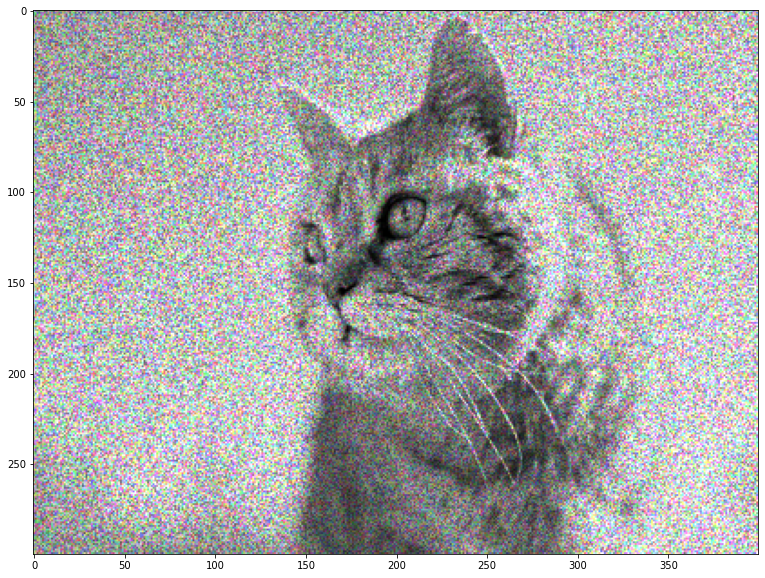

In [18]:
# ToGray(), MultiplicativeNoise() -> 순차적으로 적용하여 여러 augmentation 가능
transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

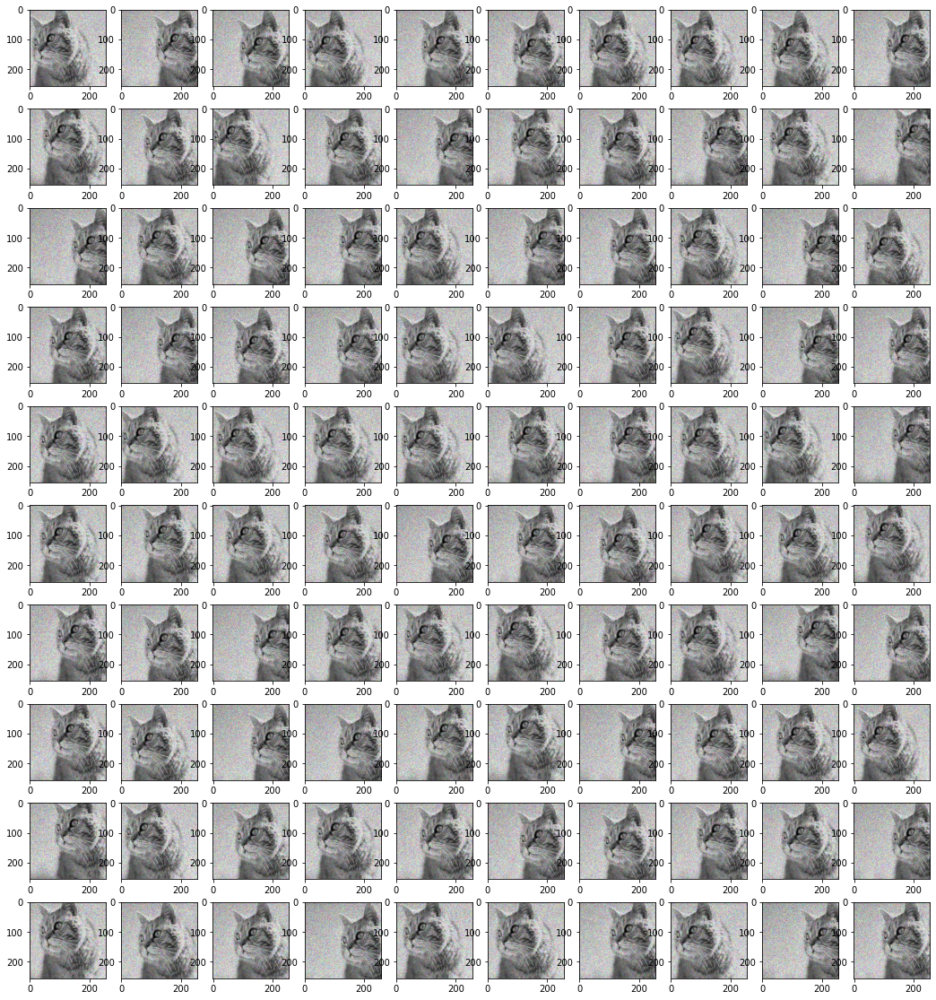

In [19]:
# Use various techniques and functions in albumentations library. show 100 images.
# ToGray(), MultiplicativeNoise(), RandomCrop()
def transform_data(img_arr):
    transform = A.Compose(
        [A.ToGray(p=1),
         A.MultiplicativeNoise(multiplier=[0.5, 1.5], 
                               elementwise=True, per_channel=True, p=1),
         A.RandomCrop(width=256, height=256)]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)